In [1]:
from utils.kernel import RBFKernel, LinearKernel, Matern52Kernel
from utils.gaussian_process import GaussianProcess as GP
import numpy as np
import pandas as pd
import scanpy as sc
import os
import scvelo as scv
import matplotlib.pyplot as plt
import random
random.seed(6)
np.random.seed(6)

In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)

scanpy==1.4.5.post2 anndata==0.6.22.post1 umap==0.3.10 numpy==1.18.1 scipy==1.4.1 pandas==0.24.2 scikit-learn==0.22.1 statsmodels==0.11.0rc1 python-igraph==0.7.1 louvain==0.6.1


In [3]:
adata = scv.datasets.pancreatic_endocrinogenesis()
adata

AnnData object with n_obs × n_vars = 3696 × 27998 
    obs: 'clusters_coarse', 'clusters', 'S_score', 'G2M_score'
    var: 'highly_variable_genes'
    uns: 'clusters_coarse_colors', 'clusters_colors', 'day_colors', 'neighbors', 'pca'
    obsm: 'X_pca', 'X_umap'
    layers: 'spliced', 'unspliced'

In [4]:
scv.pp.filter_and_normalize(adata, min_shared_counts=10, n_top_genes=2000)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)

Filtered out 19641 genes that are detected in less than 10 counts (shared).
Normalized count data: X, spliced, unspliced.
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
Logarithmized X.
computing neighbors
    finished (0:00:02) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of spliced/unspliced abundances (adata.layers)


In [5]:
# scv.tl.recover_dynamics(adata)

In [6]:
# scv.tl.velocity(adata, mode='dynamical')

In [7]:
# scv.tl.velocity_graph(adata)

In [8]:
### Check Point
# adata.write("write/pancreatic_endorinogenesis_dynamical.h5ad")
adata = sc.read_h5ad("write/pancreatic_endorinogenesis_dynamical.h5ad")

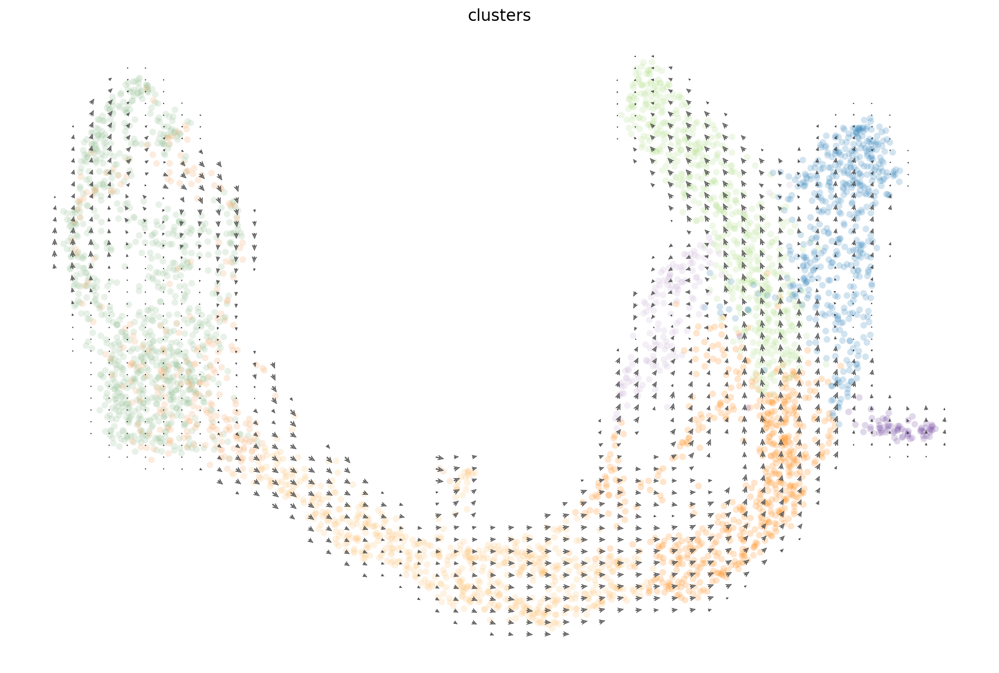

In [9]:
scv.pl.velocity_embedding_grid(adata, basis='umap', figsize=(15, 10))

In [10]:
scv.tl.rank_velocity_genes(adata, match_with='clusters', resolution=.4)
pd.DataFrame(adata.uns['rank_velocity_genes']['names'])

computing velocity clusters
    finished (0:00:00) --> added 
    'velocity_clusters', clusters based on modularity on velocity field (adata.obs)
ranking velocity genes
    finished (0:00:00) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns)


,Ductal 0,Alpha 1,Pre-endocrine 2,Beta 3,Ngn3 high EP 4,Beta 5,Ngn3 high EP 6,Pre-endocrine 7,Ductal 8,Ngn3 high EP 9,Ductal 10,Pre-endocrine 11,Alpha 12,Ductal 13,Delta 14,Beta 15
0,Notch2,Skap1,Pcsk2,Gng12,Sema3g,Ins2,Tgfbr1,Rpn2,Ccnb2,Vwa5b2,Errfi1,Fam213a,Mpzl1,Ccnb2,P2ry1,Ism1
1,Dcx,Nfasc,Abcc8,Nnat,Vwa5b2,Ism1,Ednra,Snap25,Acot7,Dner,Actn4,Rab27a,Klf10,Btbd17,Fam213a,AU019823
2,Cald1,Rab27a,Ptger3,Pappa2,Ednra,Sdk2,Emid1,Nipal1,Cenpe,Megf6,Rab27b,Gpr179,Kcnk1,Ndc80,Mapk8ip2,1700086L19Rik
3,Akr1c19,Slc29a4,Lrp8,Kctd8,Kif1a,Kctd8,Pkib,Tpst1,Notch2,Npdc1,Krt8,Abcc8,Klf13,Acot7,H2afv,Car8
4,Slc29a1,Pax6,Capsl,Ptprn,Chga,Kcnk1,Sel1l,Sema3g,Ubald2,Ednra,Cdc42ep1,Serinc2,Kdelr2,Cenpe,Ndrg1,Ffar4
5,Krt8,Cpt2,Ncam1,Crhr2,Atp2a3,Nnat,Stox1,Msmo1,Vtcn1,Lrp11,Col27a1,Ank2,Car8,Ubald2,Ambp,Sdk2
6,Hdac5,Fam219a,Scg5,Sphkap,Baiap3,Slc31a2,Gfra3,Ica1,Cdk1,Scin,Acot7,Mapk8ip2,Skap1,Rab27b,Fam213b,Kcnk16
7,Ptch1,Slc7a14,Pak3,Slc7a14,Gm13373,Rai2,Miat,Pak3,Ndc80,Herpud1,Tagln2,Ncam1,Ece1,Notch2,Cfap77,Pou6f2
8,Hspa8,Gstt1,Efcab1,Pam,Cpe,Pax6,Samd14,Kcnk16,Rorc,Grtp1,Dcdc2a,Slc7a14,Gm43861,Lockd,Sorcs2,Cd9
9,Kdm7a,Asphd1,Kcnc2,Glud1,Runx1t1,Usp18,Agap3,Ap3b2,Kifc1,Aatk,Cyr61,Gstz1,Tmem163,Vtcn1,Acat1,Slc30a8


In [11]:
def loss(true, pred, penalize_0s=True):
    error = np.square(true - pred)
    if not penalize_0s:
        error =  error[true != 0]
    return np.sqrt(np.mean(error))

# Baseline Gassian Process

    1. Using the RBF (Squared Exponent) Kernel
    2. 70% of dataset as it's smaller
    3. Optimize only for first gene in list

In [12]:
kernel = RBFKernel(alpha=0.1, gamma=1)
gp = GP(kernel=kernel, alpha=1e-5, optimize=True, restarts=0)

In [13]:
genes = {gene:i for i, gene in enumerate(list(adata.var["velocity_genes"].index)) if adata.var["velocity_genes"][gene]}
GENES = list(genes.keys())

In [14]:
error = []
error_weighted = []

X = adata.obsm["X_umap"][:, :2]

In [15]:
#### Optimize for random gene
random_gene = np.random.choice(GENES)
print(random_gene)
y = adata.X.A[:, genes[random_gene]].reshape(-1)
Y = y
gp.fit(X, Y.reshape(-1, 1), sample_ratio=0.7)
kernel.gamma

Mtmr7


array([1., 1.])

In [16]:
#### Fit On All Genes
for gene in GENES:
    y = adata.X[:, genes[gene]].A.reshape(-1)
    Y = y
    gp.fit(X, Y.reshape(-1, 1), sample_ratio=0.7)
    gp.log_marginal_likelihood(gene, info=True)
    pred = gp.predict(X)
    error.append(np.sqrt(np.mean(np.square(y - pred))))
    error_weighted.append(loss(y, pred))

Gene: Sbspon       Marginal Likelihood: [-2451.33345743]
Gene: Tbc1d8       Marginal Likelihood: [-2424.595833]
Gene: Fhl2         Marginal Likelihood: [-2526.82917396]
Gene: Slc40a1      Marginal Likelihood: [-2448.05899672]
Gene: 1700019D03Rik Marginal Likelihood: [-2415.79191725]
Gene: Pgap1        Marginal Likelihood: [-2472.52070016]
Gene: Ankrd44      Marginal Likelihood: [-2477.69569671]
Gene: Klf7         Marginal Likelihood: [-2614.75514046]
Gene: Akr1cl       Marginal Likelihood: [-2455.08677103]
Gene: Fn1          Marginal Likelihood: [-2455.15267385]
Gene: Mreg         Marginal Likelihood: [-2434.12230689]
Gene: March4       Marginal Likelihood: [-2419.23518826]
Gene: Igfbp5       Marginal Likelihood: [-2464.72753183]
Gene: Ptprn        Marginal Likelihood: [-2501.45818527]
Gene: Epha4        Marginal Likelihood: [-2391.17047566]
Gene: Serpine2     Marginal Likelihood: [-2508.20383567]
Gene: Sphkap       Marginal Likelihood: [-2526.75695394]
Gene: Dner         Marginal Like

Gene: Scpep1       Marginal Likelihood: [-2568.15133988]
Gene: Abcc3        Marginal Likelihood: [-2419.0093352]
Gene: Pdk2         Marginal Likelihood: [-2506.52092541]
Gene: Gpr179       Marginal Likelihood: [-2384.39690111]
Gene: Top2a        Marginal Likelihood: [-2462.87195549]
Gene: Krt23        Marginal Likelihood: [-2405.78697202]
Gene: Krt19        Marginal Likelihood: [-2860.35301675]
Gene: Krt17        Marginal Likelihood: [-2381.38835423]
Gene: Acly         Marginal Likelihood: [-2839.89821369]
Gene: Etv4         Marginal Likelihood: [-2386.47973835]
Gene: Mpp2         Marginal Likelihood: [-2425.24871765]
Gene: Ppy          Marginal Likelihood: [-3013.56285995]
Gene: Hdac5        Marginal Likelihood: [-2495.78823588]
Gene: 1700023F06Rik Marginal Likelihood: [-2496.68918275]
Gene: Kpna2        Marginal Likelihood: [-2428.24821879]
Gene: Cacng4       Marginal Likelihood: [-2408.12523437]
Gene: Slc16a6      Marginal Likelihood: [-2401.70474412]
Gene: Wipi1        Marginal Lik

Gene: Ptk2b        Marginal Likelihood: [-2424.95035223]
Gene: Dpysl2       Marginal Likelihood: [-2683.14577327]
Gene: Fndc3a       Marginal Likelihood: [-2665.80213683]
Gene: Serp2        Marginal Likelihood: [-2409.36569569]
Gene: Synpr        Marginal Likelihood: [-2447.6839946]
Gene: Slc4a7       Marginal Likelihood: [-2459.73412977]
Gene: Adk          Marginal Likelihood: [-2587.41056913]
Gene: Sema3g       Marginal Likelihood: [-2405.31473073]
Gene: Glud1        Marginal Likelihood: [-2994.29593323]
Gene: Wapl         Marginal Likelihood: [-2664.60411283]
Gene: Gm8113       Marginal Likelihood: [-2442.97616651]
Gene: Cdkn3        Marginal Likelihood: [-2414.74713188]
Gene: Rnase4       Marginal Likelihood: [-2715.77676694]
Gene: Slc39a2      Marginal Likelihood: [-2421.33600643]
Gene: Mmp14        Marginal Likelihood: [-2560.27103696]
Gene: Lrrc16b      Marginal Likelihood: [-2444.11788803]
Gene: Fgf9         Marginal Likelihood: [-2444.29287415]
Gene: Trim35       Marginal Like

Gene: Hbegf        Marginal Likelihood: [-2406.19452256]
Gene: Atp8b1       Marginal Likelihood: [-2615.20055022]
Gene: Rab27b       Marginal Likelihood: [-2439.74107033]
Gene: Ska1         Marginal Likelihood: [-2402.98374386]
Gene: Galr1        Marginal Likelihood: [-2438.67504028]
Gene: Tshz1        Marginal Likelihood: [-2598.20634566]
Gene: Mapre2       Marginal Likelihood: [-2508.82204229]
Gene: Kif20a       Marginal Likelihood: [-2417.27723439]
Gene: Lmnb1        Marginal Likelihood: [-2586.58318984]
Gene: Sec11c       Marginal Likelihood: [-2591.70736611]
Gene: Zfp516       Marginal Likelihood: [-2549.60703098]
Gene: Drap1        Marginal Likelihood: [-2744.33121818]
Gene: Snx15        Marginal Likelihood: [-2650.47422436]
Gene: Ppp2r5b      Marginal Likelihood: [-2580.15658829]
Gene: Gm14964      Marginal Likelihood: [-2422.01380858]
Gene: Incenp       Marginal Likelihood: [-2423.92558912]
Gene: Fen1         Marginal Likelihood: [-2486.44644781]
Gene: Tmem109      Marginal Lik

Gene: Trim46       Marginal Likelihood: [-2417.3735341]
Gene: Efna4        Marginal Likelihood: [-2509.9104556]
Gene: Il6ra        Marginal Likelihood: [-2426.35784815]
Gene: Riiad1       Marginal Likelihood: [-2473.42311289]
Gene: Ank2         Marginal Likelihood: [-2411.85295905]
Gene: 5730508B09Rik Marginal Likelihood: [-2434.32377279]
Gene: Npnt         Marginal Likelihood: [-2439.69640153]
Gene: Cyr61        Marginal Likelihood: [-2719.83906804]
Gene: Gipc2        Marginal Likelihood: [-2397.63337934]
Gene: St6galnac5   Marginal Likelihood: [-2431.62940225]
Gene: Slc2a2       Marginal Likelihood: [-2477.96113118]
Gene: Cldn11       Marginal Likelihood: [-2607.98791425]
Gene: Kcnmb2       Marginal Likelihood: [-2475.59352411]
Gene: Hspa4l       Marginal Likelihood: [-2500.45548099]
Gene: Jade1        Marginal Likelihood: [-2517.91667934]
Gene: Noct         Marginal Likelihood: [-2441.1025666]
Gene: Foxo1        Marginal Likelihood: [-2545.81445029]
Gene: P2ry1        Marginal Likel

Gene: Ccdc64       Marginal Likelihood: [-2423.64702468]
Gene: Srrm4        Marginal Likelihood: [-2392.16206012]
Gene: Atp2a2       Marginal Likelihood: [-2470.26585817]
Gene: Vps33a       Marginal Likelihood: [-2445.6487476]
Gene: Abcb9        Marginal Likelihood: [-2483.21056388]
Gene: Ccdc92       Marginal Likelihood: [-2478.12789389]
Gene: Gm42637      Marginal Likelihood: [-2527.5091162]
Gene: Vps37d       Marginal Likelihood: [-2491.00261202]
Gene: Orai2        Marginal Likelihood: [-2414.12990398]
Gene: Col26a1      Marginal Likelihood: [-2399.27290386]
Gene: Nyap1        Marginal Likelihood: [-2424.51460159]
Gene: Mcm7         Marginal Likelihood: [-2530.95823219]
Gene: Prkar1b      Marginal Likelihood: [-2564.31853797]
Gene: Mmd2         Marginal Likelihood: [-2565.19703936]
Gene: Tecpr1       Marginal Likelihood: [-2576.57395963]
Gene: Rnf6         Marginal Likelihood: [-2649.31269642]
Gene: Cdk6         Marginal Likelihood: [-2477.97199543]
Gene: Pclo         Marginal Likel

Gene: Sct          Marginal Likelihood: [-2581.72411657]
Gene: Chid1        Marginal Likelihood: [-2606.97003586]
Gene: H19          Marginal Likelihood: [-2931.83893011]
Gene: Igf2         Marginal Likelihood: [-2507.80229343]
Gene: Ins2         Marginal Likelihood: [-2686.84766497]
Gene: Ttyh1        Marginal Likelihood: [-2505.03427475]
Gene: Meis3        Marginal Likelihood: [-2504.72864098]
Gene: Dmpk         Marginal Likelihood: [-2451.84325426]
Gene: D930028M14Rik Marginal Likelihood: [-2449.60342721]
Gene: Numbl        Marginal Likelihood: [-2504.86206501]
Gene: Ppp1r14a     Marginal Likelihood: [-2577.72334265]
Gene: Clip3        Marginal Likelihood: [-2520.8344479]
Gene: Prodh2       Marginal Likelihood: [-2534.49498618]
Gene: 1600014C10Rik Marginal Likelihood: [-2447.27126931]
Gene: Kcnc3        Marginal Likelihood: [-2465.97132379]
Gene: Gas2         Marginal Likelihood: [-2475.70050306]
Gene: Fam174b      Marginal Likelihood: [-2622.28648085]
Gene: Isg20        Marginal Li

Gene: Klhl13       Marginal Likelihood: [-2457.74558814]
Gene: Akap17b      Marginal Likelihood: [-2520.15461424]
Gene: Smarca1      Marginal Likelihood: [-2658.7330159]
Gene: Gpc4         Marginal Likelihood: [-2508.1969937]
Gene: Gpc3         Marginal Likelihood: [-2554.9166331]
Gene: Mospd1       Marginal Likelihood: [-2428.11977712]
Gene: Fgf13        Marginal Likelihood: [-2380.43125161]
Gene: Ids          Marginal Likelihood: [-2588.33191536]
Gene: Xlr3a        Marginal Likelihood: [-2462.28902454]
Gene: Flna         Marginal Likelihood: [-2524.49352665]
Gene: Gk           Marginal Likelihood: [-2424.33573641]
Gene: Pola1        Marginal Likelihood: [-2463.62516744]
Gene: Pdk3         Marginal Likelihood: [-2696.83786425]
Gene: Tspan6       Marginal Likelihood: [-2547.09468807]
Gene: Sytl4        Marginal Likelihood: [-2454.9103517]
Gene: Tmsb15l      Marginal Likelihood: [-2554.45367732]
Gene: Dcx          Marginal Likelihood: [-2493.24573996]
Gene: Maged2       Marginal Likelih

### Rank Genes by Smoothness

Get top and last 10 genes by smoothness

In [17]:
lh = gp.get_all_likelihoods()
top = list(zip(*sorted(list(lh.items()), key=lambda x:x[1], reverse=True)))[0]
last = top[::-1]
top[:10]

('Fgf13',
 'Krt17',
 'Ankrd1',
 'Tmem132b',
 'Ism1',
 'Gsg1l',
 '4931429I11Rik',
 'Gsg1l2',
 'Gpr179',
 'Ebf1')

In [18]:
last[:10]

('Gnas',
 'Chga',
 'Krt8',
 'Hspa8',
 'Ambp',
 'Nnat',
 'Ppy',
 'H2afv',
 'Glud1',
 'Meis2')

### Inspect Corelation Between Genes

Plot the correlation between top 3:

    1. smoothest and least smooth genes
    2. smoothest and smoothest genes
    3. lest smooth and leat smooth genes

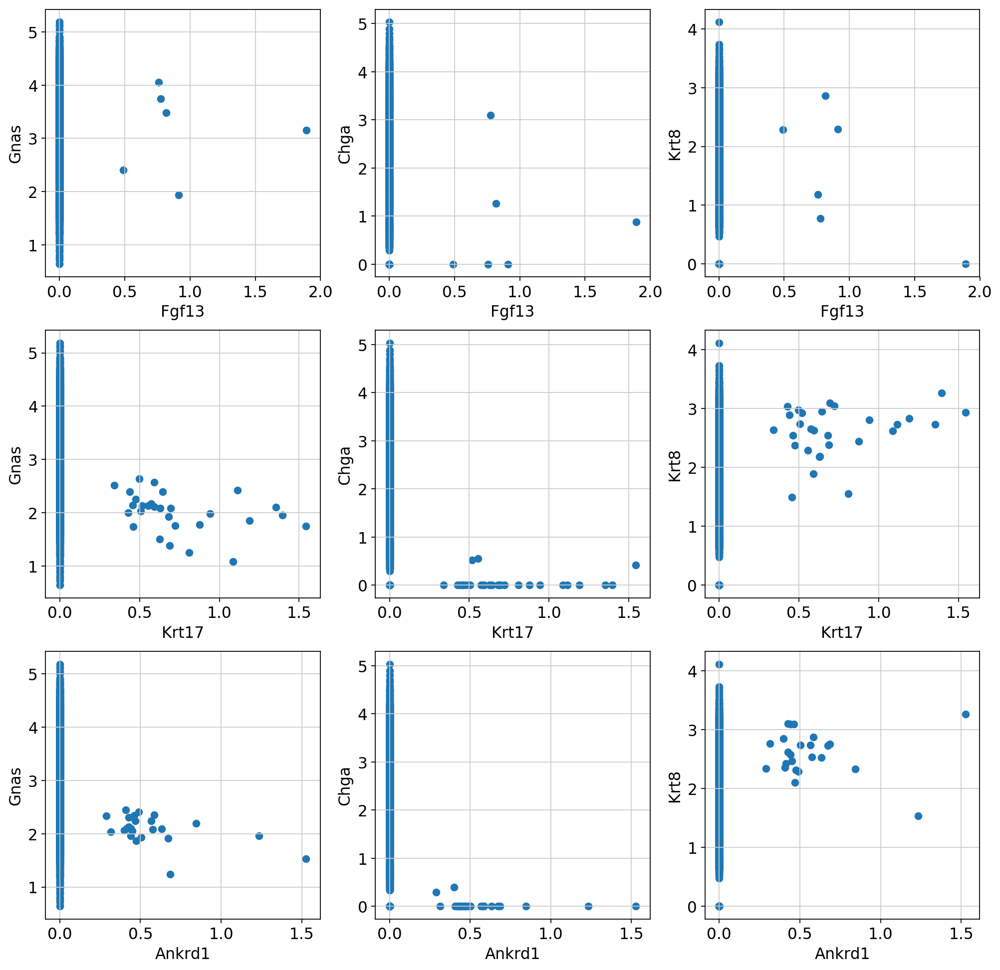

In [19]:
fig, ax = plt.subplots(3, 3, figsize=(15, 15))
for i, genei in enumerate(top[:3]):
    for j, genej in enumerate(last[:3]):
        ax[i][j].scatter(adata.X[:, genes[genei]].A, adata.X[:, genes[genej]].A)
        ax[i][j].set_xlabel(genei)
        ax[i][j].set_ylabel(genej)

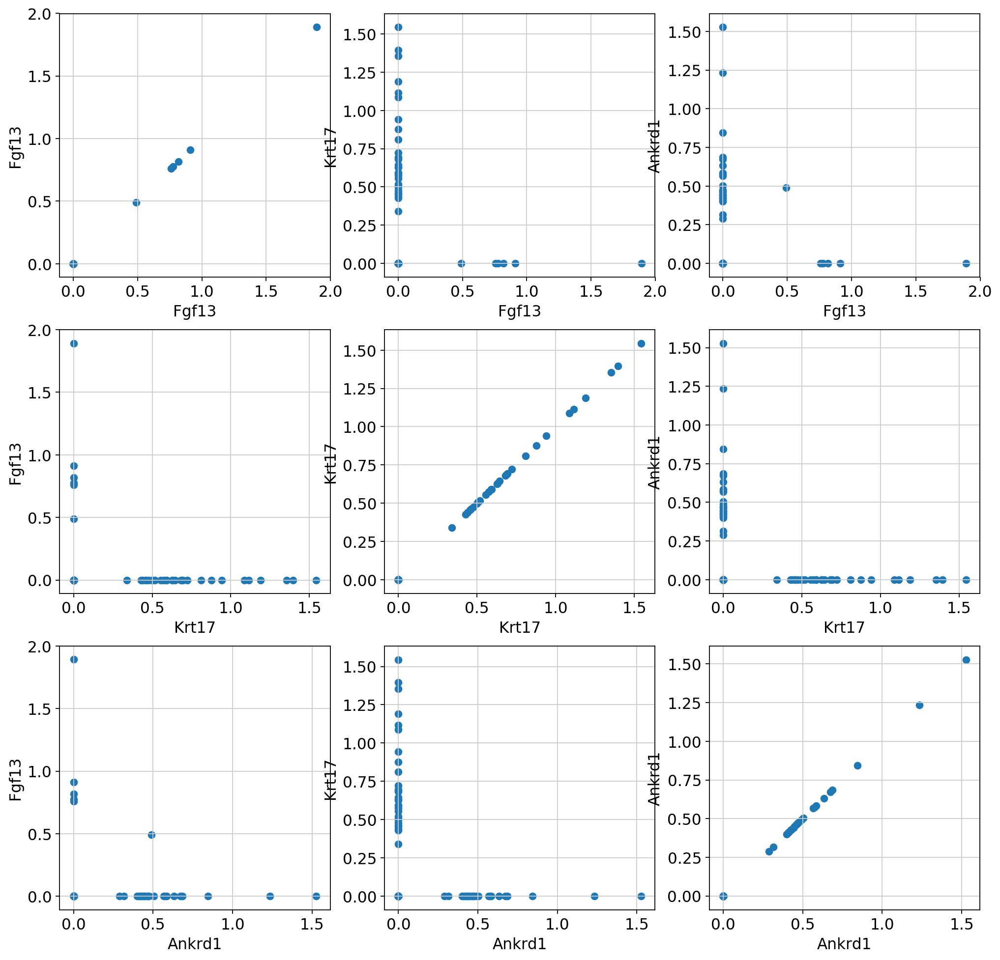

In [20]:
fig, ax = plt.subplots(3, 3, figsize=(15, 15))
for i, genei in enumerate(top[:3]):
    for j, genej in enumerate(top[:3]):
        ax[i][j].scatter(adata.X[:, genes[genei]].A, adata.X[:, genes[genej]].A)
        ax[i][j].set_xlabel(genei)
        ax[i][j].set_ylabel(genej)

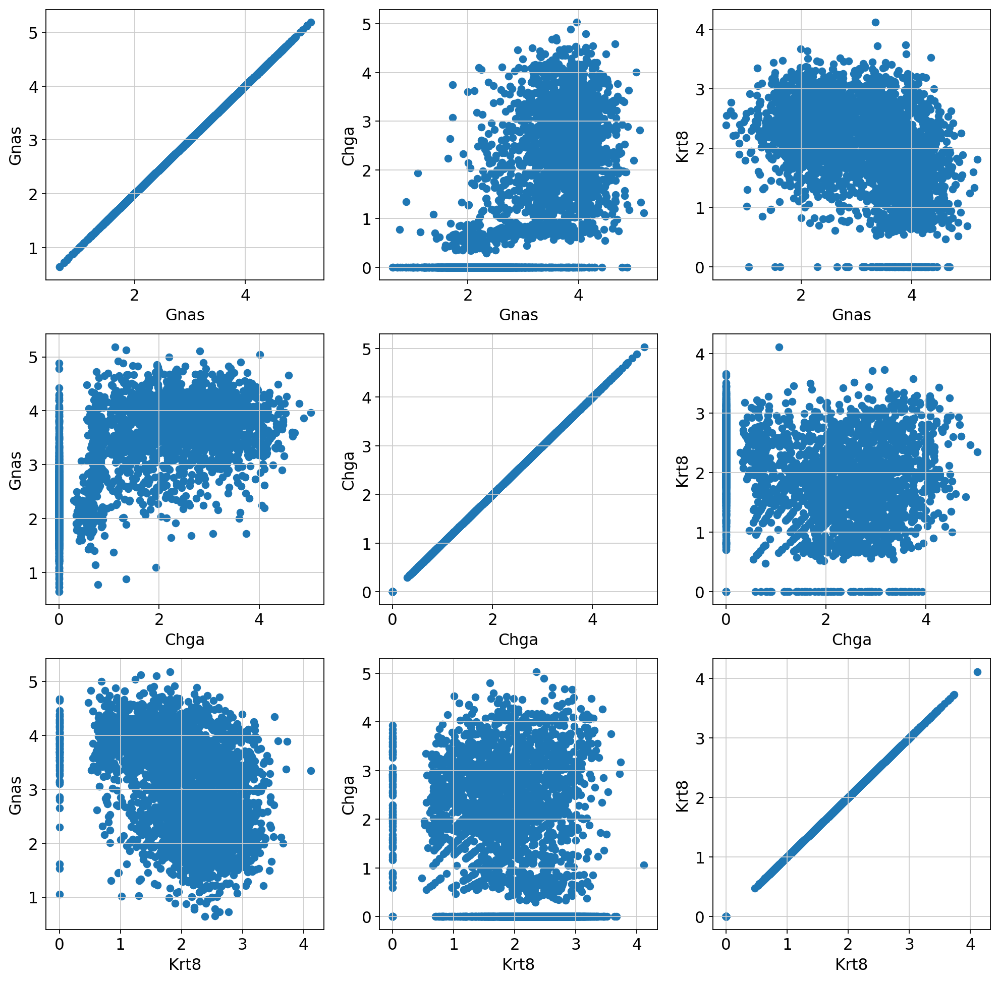

In [21]:
fig, ax = plt.subplots(3, 3, figsize=(15, 15))
for i, genei in enumerate(last[:3]):
    for j, genej in enumerate(last[:3]):
        ax[i][j].scatter(adata.X[:, genes[genei]].A, adata.X[:, genes[genej]].A)
        ax[i][j].set_xlabel(genei)
        ax[i][j].set_ylabel(genej)

# Gaussian Process with RNA Velocity Observations

Enhance the model by adding RNA Velocities

    1. Use 70% of the dataset as it's extremely sparse

In [22]:
kernel_do = RBFKernel(alpha=0.1, gamma=1)
gp_do = GP(kernel=kernel_do, alpha=1e-5, derivative_observations=True, optimize=True, restarts=0)

In [23]:
errors_do = []
weighted_errors_do = []

X = adata.obsm["X_umap"][:, :2]
dy_x1 = adata.obsm["velocity_umap"][:, 0]
dy_x2 = adata.obsm["velocity_umap"][:, 1]

In [24]:
# #### Use the same gammas as in the baseline model
gp_do.gamma = gp.kernel.gamma

In [25]:
data = adata.X.A
for gene in GENES:
    y = data[:, genes[gene]].reshape(-1)
    Y = np.hstack((y, dy_x1, dy_x2))
    gp_do.fit(X, Y.reshape(-1, 1), sample_ratio=0.7)
    gp_do.log_marginal_likelihood(gene, info=True)
    pred = gp_do.predict(X)
    errors_do.append(np.sqrt(np.mean(np.square(y - pred))))
    weighted_errors_do.append(loss(y, pred))

Gene: Sbspon       Marginal Likelihood: [-2455.91330793]
Gene: Tbc1d8       Marginal Likelihood: [-2428.33759763]
Gene: Fhl2         Marginal Likelihood: [-2531.92657429]
Gene: Slc40a1      Marginal Likelihood: [-2454.69224472]
Gene: 1700019D03Rik Marginal Likelihood: [-2425.48881885]
Gene: Pgap1        Marginal Likelihood: [-2477.27737242]
Gene: Ankrd44      Marginal Likelihood: [-2481.58917101]
Gene: Klf7         Marginal Likelihood: [-2622.17768015]
Gene: Akr1cl       Marginal Likelihood: [-2465.06639178]
Gene: Fn1          Marginal Likelihood: [-2460.94482498]
Gene: Mreg         Marginal Likelihood: [-2431.76042776]
Gene: March4       Marginal Likelihood: [-2423.75713774]
Gene: Igfbp5       Marginal Likelihood: [-2467.37614676]
Gene: Ptprn        Marginal Likelihood: [-2497.33761928]
Gene: Epha4        Marginal Likelihood: [-2397.43290252]
Gene: Serpine2     Marginal Likelihood: [-2516.31870663]
Gene: Sphkap       Marginal Likelihood: [-2538.65709692]
Gene: Dner         Marginal Li

Gene: Dhx40        Marginal Likelihood: [-2522.41572313]
Gene: Gdpd1        Marginal Likelihood: [-2609.49184622]
Gene: Scpep1       Marginal Likelihood: [-2566.97606147]
Gene: Abcc3        Marginal Likelihood: [-2423.25460939]
Gene: Pdk2         Marginal Likelihood: [-2514.55169638]
Gene: Gpr179       Marginal Likelihood: [-2386.42502486]
Gene: Top2a        Marginal Likelihood: [-2471.14427751]
Gene: Krt23        Marginal Likelihood: [-2410.83037425]
Gene: Krt19        Marginal Likelihood: [-2850.41442725]
Gene: Krt17        Marginal Likelihood: [-2389.85310006]
Gene: Acly         Marginal Likelihood: [-2827.30636809]
Gene: Etv4         Marginal Likelihood: [-2389.46522035]
Gene: Mpp2         Marginal Likelihood: [-2425.52856694]
Gene: Ppy          Marginal Likelihood: [-3011.12652681]
Gene: Hdac5        Marginal Likelihood: [-2496.41360742]
Gene: 1700023F06Rik Marginal Likelihood: [-2497.03292471]
Gene: Kpna2        Marginal Likelihood: [-2433.02216803]
Gene: Cacng4       Marginal Li

Gene: Jph4         Marginal Likelihood: [-2419.29841861]
Gene: Ptk2b        Marginal Likelihood: [-2429.63502792]
Gene: Dpysl2       Marginal Likelihood: [-2677.21078256]
Gene: Fndc3a       Marginal Likelihood: [-2662.99431952]
Gene: Serp2        Marginal Likelihood: [-2411.64732184]
Gene: Synpr        Marginal Likelihood: [-2448.28740028]
Gene: Slc4a7       Marginal Likelihood: [-2462.4803287]
Gene: Adk          Marginal Likelihood: [-2595.26395785]
Gene: Sema3g       Marginal Likelihood: [-2405.35869509]
Gene: Glud1        Marginal Likelihood: [-3007.61336277]
Gene: Wapl         Marginal Likelihood: [-2662.05958927]
Gene: Gm8113       Marginal Likelihood: [-2448.89785349]
Gene: Cdkn3        Marginal Likelihood: [-2418.03303445]
Gene: Rnase4       Marginal Likelihood: [-2722.24872934]
Gene: Slc39a2      Marginal Likelihood: [-2424.9461614]
Gene: Mmp14        Marginal Likelihood: [-2558.02366938]
Gene: Lrrc16b      Marginal Likelihood: [-2447.79622983]
Gene: Fgf9         Marginal Likel

Gene: Cdc25c       Marginal Likelihood: [-2400.66955373]
Gene: Hbegf        Marginal Likelihood: [-2414.04394638]
Gene: Atp8b1       Marginal Likelihood: [-2621.00346798]
Gene: Rab27b       Marginal Likelihood: [-2446.17070422]
Gene: Ska1         Marginal Likelihood: [-2406.73391785]
Gene: Galr1        Marginal Likelihood: [-2444.37270691]
Gene: Tshz1        Marginal Likelihood: [-2600.03969414]
Gene: Mapre2       Marginal Likelihood: [-2518.85314865]
Gene: Kif20a       Marginal Likelihood: [-2423.17237483]
Gene: Lmnb1        Marginal Likelihood: [-2591.02886071]
Gene: Sec11c       Marginal Likelihood: [-2597.72867172]
Gene: Zfp516       Marginal Likelihood: [-2540.47368502]
Gene: Drap1        Marginal Likelihood: [-2752.90791351]
Gene: Snx15        Marginal Likelihood: [-2652.73222625]
Gene: Ppp2r5b      Marginal Likelihood: [-2583.89641304]
Gene: Gm14964      Marginal Likelihood: [-2426.25017783]
Gene: Incenp       Marginal Likelihood: [-2427.51991533]
Gene: Fen1         Marginal Lik

Gene: Pmf1         Marginal Likelihood: [-2564.76844742]
Gene: Lmna         Marginal Likelihood: [-2682.63258741]
Gene: Syt11        Marginal Likelihood: [-2457.78891619]
Gene: Trim46       Marginal Likelihood: [-2417.97017188]
Gene: Efna4        Marginal Likelihood: [-2507.09705199]
Gene: Il6ra        Marginal Likelihood: [-2430.44552078]
Gene: Riiad1       Marginal Likelihood: [-2481.99788761]
Gene: Ank2         Marginal Likelihood: [-2414.83325099]
Gene: 5730508B09Rik Marginal Likelihood: [-2438.77738131]
Gene: Npnt         Marginal Likelihood: [-2444.85323709]
Gene: Cyr61        Marginal Likelihood: [-2738.04861351]
Gene: Gipc2        Marginal Likelihood: [-2403.02238838]
Gene: St6galnac5   Marginal Likelihood: [-2437.55878217]
Gene: Slc2a2       Marginal Likelihood: [-2479.48705233]
Gene: Cldn11       Marginal Likelihood: [-2613.72563158]
Gene: Kcnmb2       Marginal Likelihood: [-2492.89169513]
Gene: Hspa4l       Marginal Likelihood: [-2503.90959201]
Gene: Jade1        Marginal Li

Gene: Miat         Marginal Likelihood: [-2497.24579864]
Gene: Sez6l        Marginal Likelihood: [-2440.67110638]
Gene: Sgsm1        Marginal Likelihood: [-2431.16976808]
Gene: Svop         Marginal Likelihood: [-2397.52617421]
Gene: Ccdc64       Marginal Likelihood: [-2427.39510657]
Gene: Srrm4        Marginal Likelihood: [-2395.70288253]
Gene: Atp2a2       Marginal Likelihood: [-2474.74695302]
Gene: Vps33a       Marginal Likelihood: [-2446.00592678]
Gene: Abcb9        Marginal Likelihood: [-2483.20075228]
Gene: Ccdc92       Marginal Likelihood: [-2477.01293381]
Gene: Gm42637      Marginal Likelihood: [-2525.94532526]
Gene: Vps37d       Marginal Likelihood: [-2498.97951195]
Gene: Orai2        Marginal Likelihood: [-2418.15777813]
Gene: Col26a1      Marginal Likelihood: [-2403.81155626]
Gene: Nyap1        Marginal Likelihood: [-2431.13744341]
Gene: Mcm7         Marginal Likelihood: [-2534.14792253]
Gene: Prkar1b      Marginal Likelihood: [-2565.28344322]
Gene: Mmd2         Marginal Lik

Gene: Ikzf5        Marginal Likelihood: [-2464.28001388]
Gene: Chst15       Marginal Likelihood: [-2394.72603961]
Gene: Fam53b       Marginal Likelihood: [-2418.85929671]
Gene: Mki67        Marginal Likelihood: [-2441.66625763]
Gene: Sct          Marginal Likelihood: [-2581.86418234]
Gene: Chid1        Marginal Likelihood: [-2610.131548]
Gene: H19          Marginal Likelihood: [-2933.27676145]
Gene: Igf2         Marginal Likelihood: [-2510.16866411]
Gene: Ins2         Marginal Likelihood: [-2683.36970295]
Gene: Ttyh1        Marginal Likelihood: [-2508.64318575]
Gene: Meis3        Marginal Likelihood: [-2506.85016137]
Gene: Dmpk         Marginal Likelihood: [-2452.02598114]
Gene: D930028M14Rik Marginal Likelihood: [-2455.73008362]
Gene: Numbl        Marginal Likelihood: [-2502.41857817]
Gene: Ppp1r14a     Marginal Likelihood: [-2571.69432227]
Gene: Clip3        Marginal Likelihood: [-2528.684702]
Gene: Prodh2       Marginal Likelihood: [-2529.67353591]
Gene: 1600014C10Rik Marginal Likel

Gene: Entpd3       Marginal Likelihood: [-2520.01557078]
Gene: Snrk         Marginal Likelihood: [-2508.19798247]
Gene: Hdac6        Marginal Likelihood: [-2555.70539746]
Gene: Glod5        Marginal Likelihood: [-2427.02159]
Gene: Maob         Marginal Likelihood: [-2456.90752828]
Gene: Syn1         Marginal Likelihood: [-2412.19899158]
Gene: Klhl13       Marginal Likelihood: [-2468.45861373]
Gene: Akap17b      Marginal Likelihood: [-2530.74836874]
Gene: Smarca1      Marginal Likelihood: [-2664.75327798]
Gene: Gpc4         Marginal Likelihood: [-2519.97445794]
Gene: Gpc3         Marginal Likelihood: [-2556.79146419]
Gene: Mospd1       Marginal Likelihood: [-2431.21344335]
Gene: Fgf13        Marginal Likelihood: [-2384.70801297]
Gene: Ids          Marginal Likelihood: [-2588.8866418]
Gene: Xlr3a        Marginal Likelihood: [-2463.34664915]
Gene: Flna         Marginal Likelihood: [-2525.47107888]
Gene: Gk           Marginal Likelihood: [-2430.32479961]
Gene: Pola1        Marginal Likelih

In [26]:
lh_do = gp.get_all_likelihoods()
top_do = list(zip(*sorted(list(lh_do.items()), key=lambda x:x[1], reverse=True)))[0]
last_do = top_do[::-1]
top_do[:10]

('Fgf13',
 'Krt17',
 'Ankrd1',
 'Tmem132b',
 'Ism1',
 'Gsg1l',
 '4931429I11Rik',
 'Gsg1l2',
 'Gpr179',
 'Ebf1')

In [27]:
last_do[:10]

('Gnas',
 'Chga',
 'Krt8',
 'Hspa8',
 'Ambp',
 'Nnat',
 'Ppy',
 'H2afv',
 'Glud1',
 'Meis2')

# Gaussian Process with RBF + Linear Kernel

    1. Use 70% of the data

Check how RBF + Linear Kernel compares to the one with RNA Velocity observations

In [28]:
kernel_combined = RBFKernel(alpha=0.1, gamma=1) + LinearKernel(scale=0.1, sigma=0.0)
gp_combined = GP(kernel=kernel_combined, alpha=1e-5, optimize=False)

In [29]:
errors_combined = []
weighted_errors_combined = []

X = adata.obsm["X_umap"][:, :2]

In [30]:
#### Use the same gammas as in the baseline model
gp_combined.kernel.gamma = gp.kernel.gamma

In [31]:
data = adata.X.A
for gene in GENES:
    y = data[:, genes[gene]].reshape(-1)
    Y = y
    gp_combined.fit(X, Y.reshape(-1, 1), sample_ratio=0.7)
    gp_combined.log_marginal_likelihood(gene, info=True)
    pred = gp_combined.predict(X)
    errors_combined.append(np.sqrt(np.sum((y - pred)**2)/X.shape[0]))
    weighted_errors_combined.append(loss(y, pred))

Gene: Sbspon       Marginal Likelihood: [-4773.60322223]
Gene: Tbc1d8       Marginal Likelihood: [-4743.58551964]
Gene: Fhl2         Marginal Likelihood: [-4841.91751945]
Gene: Slc40a1      Marginal Likelihood: [-4769.61355766]
Gene: 1700019D03Rik Marginal Likelihood: [-4737.2374523]
Gene: Pgap1        Marginal Likelihood: [-4790.10268551]
Gene: Ankrd44      Marginal Likelihood: [-4798.45022326]
Gene: Klf7         Marginal Likelihood: [-4938.17400592]
Gene: Akr1cl       Marginal Likelihood: [-4772.37570675]
Gene: Fn1          Marginal Likelihood: [-4771.08473846]
Gene: Mreg         Marginal Likelihood: [-4745.47026221]
Gene: March4       Marginal Likelihood: [-4737.28188739]
Gene: Igfbp5       Marginal Likelihood: [-4779.06867234]
Gene: Ptprn        Marginal Likelihood: [-4815.02821735]
Gene: Epha4        Marginal Likelihood: [-4708.97372104]
Gene: Serpine2     Marginal Likelihood: [-4824.75032081]
Gene: Sphkap       Marginal Likelihood: [-4839.12065747]
Gene: Dner         Marginal Lik

Gene: Gdpd1        Marginal Likelihood: [-4917.73455409]
Gene: Scpep1       Marginal Likelihood: [-4882.86475337]
Gene: Abcc3        Marginal Likelihood: [-4736.1082558]
Gene: Pdk2         Marginal Likelihood: [-4823.8568092]
Gene: Gpr179       Marginal Likelihood: [-4701.77034496]
Gene: Top2a        Marginal Likelihood: [-4768.92550368]
Gene: Krt23        Marginal Likelihood: [-4725.76949597]
Gene: Krt19        Marginal Likelihood: [-5137.85749588]
Gene: Krt17        Marginal Likelihood: [-4703.0283671]
Gene: Acly         Marginal Likelihood: [-5155.54227285]
Gene: Etv4         Marginal Likelihood: [-4703.43582116]
Gene: Mpp2         Marginal Likelihood: [-4743.10039018]
Gene: Ppy          Marginal Likelihood: [-5285.96514567]
Gene: Hdac5        Marginal Likelihood: [-4810.5210782]
Gene: 1700023F06Rik Marginal Likelihood: [-4810.10946368]
Gene: Kpna2        Marginal Likelihood: [-4749.23044855]
Gene: Cacng4       Marginal Likelihood: [-4723.19828479]
Gene: Slc16a6      Marginal Likeli

Gene: Ptk2b        Marginal Likelihood: [-4743.03828645]
Gene: Dpysl2       Marginal Likelihood: [-5001.61303192]
Gene: Fndc3a       Marginal Likelihood: [-4978.09203814]
Gene: Serp2        Marginal Likelihood: [-4727.40254229]
Gene: Synpr        Marginal Likelihood: [-4762.86809253]
Gene: Slc4a7       Marginal Likelihood: [-4779.13344721]
Gene: Adk          Marginal Likelihood: [-4900.39785988]
Gene: Sema3g       Marginal Likelihood: [-4720.31894931]
Gene: Glud1        Marginal Likelihood: [-5303.61331625]
Gene: Wapl         Marginal Likelihood: [-4971.92370584]
Gene: Gm8113       Marginal Likelihood: [-4761.34267915]
Gene: Cdkn3        Marginal Likelihood: [-4731.03381854]
Gene: Rnase4       Marginal Likelihood: [-5025.2477657]
Gene: Slc39a2      Marginal Likelihood: [-4735.83336486]
Gene: Mmp14        Marginal Likelihood: [-4863.62069296]
Gene: Lrrc16b      Marginal Likelihood: [-4763.39814366]
Gene: Fgf9         Marginal Likelihood: [-4766.3082579]
Gene: Trim35       Marginal Likel

Gene: Atp8b1       Marginal Likelihood: [-4931.6084787]
Gene: Rab27b       Marginal Likelihood: [-4759.44320824]
Gene: Ska1         Marginal Likelihood: [-4719.99629296]
Gene: Galr1        Marginal Likelihood: [-4758.41666643]
Gene: Tshz1        Marginal Likelihood: [-4918.23206403]
Gene: Mapre2       Marginal Likelihood: [-4829.72875334]
Gene: Kif20a       Marginal Likelihood: [-4732.69358666]
Gene: Lmnb1        Marginal Likelihood: [-4894.09593204]
Gene: Sec11c       Marginal Likelihood: [-4907.48270702]
Gene: Zfp516       Marginal Likelihood: [-4852.52754533]
Gene: Drap1        Marginal Likelihood: [-5060.86033407]
Gene: Snx15        Marginal Likelihood: [-4958.11817262]
Gene: Ppp2r5b      Marginal Likelihood: [-4894.17749254]
Gene: Gm14964      Marginal Likelihood: [-4744.99654584]
Gene: Incenp       Marginal Likelihood: [-4742.13007503]
Gene: Fen1         Marginal Likelihood: [-4801.00504592]
Gene: Tmem109      Marginal Likelihood: [-4886.63020151]
Gene: Ankrd1       Marginal Like

Gene: Trim46       Marginal Likelihood: [-4732.34478403]
Gene: Efna4        Marginal Likelihood: [-4821.78966712]
Gene: Il6ra        Marginal Likelihood: [-4743.67059748]
Gene: Riiad1       Marginal Likelihood: [-4798.41126768]
Gene: Ank2         Marginal Likelihood: [-4731.56957748]
Gene: 5730508B09Rik Marginal Likelihood: [-4754.91811191]
Gene: Npnt         Marginal Likelihood: [-4757.75166287]
Gene: Cyr61        Marginal Likelihood: [-5021.58769549]
Gene: Gipc2        Marginal Likelihood: [-4716.92892589]
Gene: St6galnac5   Marginal Likelihood: [-4748.58034735]
Gene: Slc2a2       Marginal Likelihood: [-4790.60483125]
Gene: Cldn11       Marginal Likelihood: [-4923.41174516]
Gene: Kcnmb2       Marginal Likelihood: [-4794.7628481]
Gene: Hspa4l       Marginal Likelihood: [-4817.58937324]
Gene: Jade1        Marginal Likelihood: [-4836.56883282]
Gene: Noct         Marginal Likelihood: [-4759.46183089]
Gene: Foxo1        Marginal Likelihood: [-4867.74167711]
Gene: P2ry1        Marginal Lik

Gene: Ccdc64       Marginal Likelihood: [-4742.60719282]
Gene: Srrm4        Marginal Likelihood: [-4709.09076061]
Gene: Atp2a2       Marginal Likelihood: [-4784.26320918]
Gene: Vps33a       Marginal Likelihood: [-4761.97748815]
Gene: Abcb9        Marginal Likelihood: [-4799.50587963]
Gene: Ccdc92       Marginal Likelihood: [-4793.71241345]
Gene: Gm42637      Marginal Likelihood: [-4843.64257639]
Gene: Vps37d       Marginal Likelihood: [-4807.47987584]
Gene: Orai2        Marginal Likelihood: [-4735.87916523]
Gene: Col26a1      Marginal Likelihood: [-4717.22465886]
Gene: Nyap1        Marginal Likelihood: [-4744.92333181]
Gene: Mcm7         Marginal Likelihood: [-4844.01051907]
Gene: Prkar1b      Marginal Likelihood: [-4883.59173908]
Gene: Mmd2         Marginal Likelihood: [-4883.08099771]
Gene: Tecpr1       Marginal Likelihood: [-4895.03824266]
Gene: Rnf6         Marginal Likelihood: [-4969.16952439]
Gene: Cdk6         Marginal Likelihood: [-4789.50607344]
Gene: Pclo         Marginal Lik

Gene: Mki67        Marginal Likelihood: [-4744.19119728]
Gene: Sct          Marginal Likelihood: [-4889.03474938]
Gene: Chid1        Marginal Likelihood: [-4925.10351467]
Gene: H19          Marginal Likelihood: [-5191.10500142]
Gene: Igf2         Marginal Likelihood: [-4823.43149325]
Gene: Ins2         Marginal Likelihood: [-4949.12764491]
Gene: Ttyh1        Marginal Likelihood: [-4820.90641078]
Gene: Meis3        Marginal Likelihood: [-4826.09321425]
Gene: Dmpk         Marginal Likelihood: [-4768.94249615]
Gene: D930028M14Rik Marginal Likelihood: [-4766.03059428]
Gene: Numbl        Marginal Likelihood: [-4817.40944983]
Gene: Ppp1r14a     Marginal Likelihood: [-4876.13286565]
Gene: Clip3        Marginal Likelihood: [-4840.89274108]
Gene: Prodh2       Marginal Likelihood: [-4837.22053022]
Gene: 1600014C10Rik Marginal Likelihood: [-4761.60081022]
Gene: Kcnc3        Marginal Likelihood: [-4781.9617695]
Gene: Gas2         Marginal Likelihood: [-4789.27590701]
Gene: Fam174b      Marginal Li

Gene: Maob         Marginal Likelihood: [-4768.13765452]
Gene: Syn1         Marginal Likelihood: [-4721.7689584]
Gene: Klhl13       Marginal Likelihood: [-4778.13337845]
Gene: Akap17b      Marginal Likelihood: [-4835.96813713]
Gene: Smarca1      Marginal Likelihood: [-4955.91376699]
Gene: Gpc4         Marginal Likelihood: [-4823.74004244]
Gene: Gpc3         Marginal Likelihood: [-4867.79189823]
Gene: Mospd1       Marginal Likelihood: [-4744.18426889]
Gene: Fgf13        Marginal Likelihood: [-4698.30454184]
Gene: Ids          Marginal Likelihood: [-4906.63516445]
Gene: Xlr3a        Marginal Likelihood: [-4785.06842959]
Gene: Flna         Marginal Likelihood: [-4838.00581767]
Gene: Gk           Marginal Likelihood: [-4737.17946658]
Gene: Pola1        Marginal Likelihood: [-4781.49172682]
Gene: Pdk3         Marginal Likelihood: [-4997.15272957]
Gene: Tspan6       Marginal Likelihood: [-4866.55070257]
Gene: Sytl4        Marginal Likelihood: [-4767.77608538]
Gene: Tmsb15l      Marginal Like

In [32]:
lh_combined = gp_combined.get_all_likelihoods()
top_combined = list(zip(*sorted(list(lh_combined.items()), key=lambda x:x[1], reverse=True)))[0]
last_combined = top_combined[::-1]
top_combined[:10]

('Fgf13',
 'Ankrd1',
 'Ism1',
 'Gsg1l2',
 'Tmem132b',
 'Gpr179',
 '4931429I11Rik',
 'Krt17',
 'Etv4',
 'Ebf1')

In [33]:
last_combined[:10]

('Gnas',
 'Krt8',
 'Chga',
 'Hspa8',
 'Ambp',
 'Nnat',
 'Glud1',
 'H2afv',
 'Ppy',
 'Marcks')

## Look at Smoothest and Least Genes

All three models agree on some the smoothest genes so let's inspect them

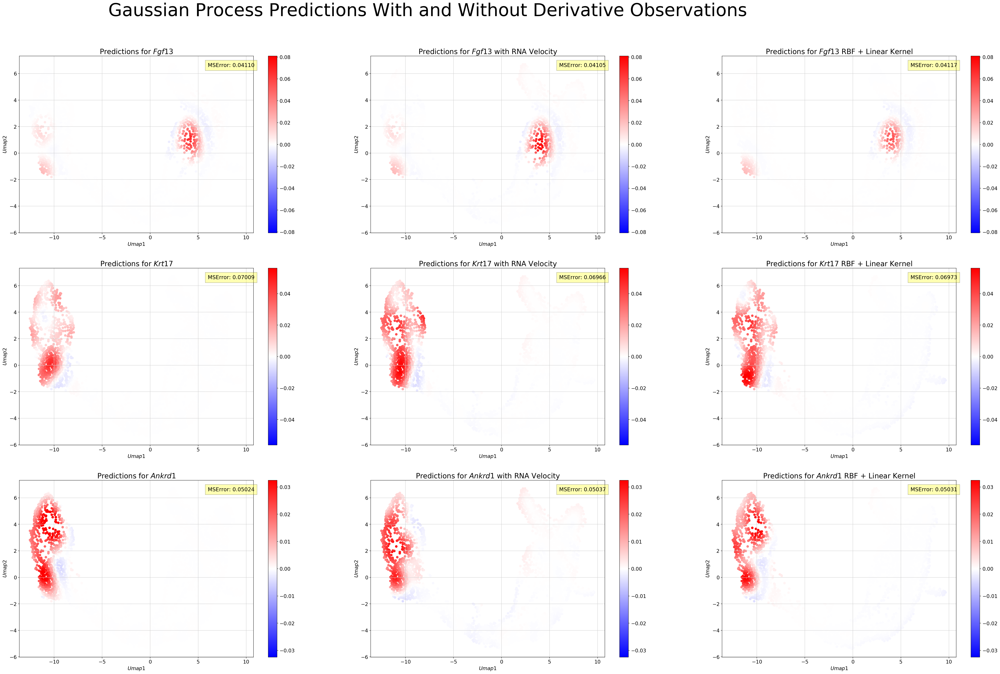

In [34]:
%matplotlib inline
fig, axs = plt.subplots(3, 3, figsize=(50,30))
dy_x1 = adata.obsm["velocity_umap"][:, 0]
dy_x2 = adata.obsm["velocity_umap"][:, 1]
X = adata.obsm["X_umap"][:, :2]
for i, gene in enumerate(top[:3]):

    y = adata.X[:, genes[gene]].A.reshape(-1)
    gp.fit(X, y.reshape(-1, 1), sample_ratio=0.7)
    pred = gp.predict(X)
    gp_error = loss(y, pred.reshape(-1))
    
    Y = np.hstack((y.reshape(-1), dy_x1, dy_x2))
    gp_do.fit(X, Y.reshape(-1, 1), sample_ratio=0.7)
    pred_do = gp_do.predict(X)
    gp_do_error = loss(y, pred_do.reshape(-1))

    gp_combined.fit(X, y.reshape(-1, 1), sample_ratio=0.7)
    pred_combined = gp_combined.predict(X)
    gp_combined_error = loss(y, pred_combined.reshape(-1))
    
    _min, _max = -max(pred_do), max(pred_do)

    p = axs[i][0].scatter(X[:, 0], X[:, 1],  c=pred.reshape(-1), vmin=_min, vmax=_max, cmap='bwr')
    axs[i][0].text(6, 6.5, 'MSError: {:.5f}'.format(gp_error),
        bbox={'facecolor': 'yellow', 'alpha': 0.3, 'pad': 7}, fontsize=15)
    axs[i][0].set_xlabel('$Umap1$')
    axs[i][0].set_ylabel('$Umap2$')
    axs[i][0].set_title("Predictions for ${gene}$".format(gene=gene), fontsize=20)
    fig.colorbar(p, ax=axs[i][0])

    p = axs[i][1].scatter(X[:, 0], X[:, 1],  c=pred_do.reshape(-1), vmin=_min, vmax=_max, cmap='bwr')
    axs[i][1].text(6, 6.5, 'MSError: {:.5f}'.format(gp_do_error),
        bbox={'facecolor': 'yellow', 'alpha': 0.3, 'pad': 7}, fontsize=15)
    axs[i][1].set_xlabel('$Umap1$')
    axs[i][1].set_ylabel('$Umap2$')
    axs[i][1].set_title("Predictions for ${gene}$ with RNA Velocity".format(gene=gene), fontsize=20)
    fig.colorbar(p, ax=axs[i][1])
    

    p = axs[i][2].scatter(X[:, 0], X[:, 1],  c=pred_combined.reshape(-1), vmin=_min, vmax=_max, cmap='bwr')
    axs[i][2].text(6, 6.5, 'MSError: {:.5f}'.format(gp_combined_error),
        bbox={'facecolor': 'yellow', 'alpha': 0.3, 'pad': 7}, fontsize=15)
    axs[i][2].set_xlabel('$Umap1$')
    axs[i][2].set_ylabel('$Umap2$')
    axs[i][2].set_title("Predictions for ${gene}$ RBF + Linear Kernel".format(gene=gene), fontsize=20)
    fig.colorbar(p, ax=axs[i][2])
    
#     scv.pl.velocity_embedding_grid(adata, density = 0.4, basis='X_umap', color=gene, color_map="bwr",
#                                    size=300, alpha=0.3, arrow_length=3, arrow_size=2.3, colorbar=True,
#                                    show=False, ax=axs[i][3],
#                                    title="Actual values for ${gene}$ with RNA Velocity".format(gene=gene),
#                                    fontsize=20)
#     p = axs[i][2].scatter(X[:, 0], X[:, 1],  c=np.absolute(matrix.X[:, gene_id[gene]] - pred.reshape(-1)), cmap='Greys', alpha=0.5)

#     fig.colorbar(p, ax=axs[i][2])
    
fig.suptitle("Gaussian Process Predictions With and Without Derivative Observations",  fontsize=50)   
fig.savefig("pancreatic_endocrinogenesis_top_3_smoothest_genes_3_models.png", transparent=False)

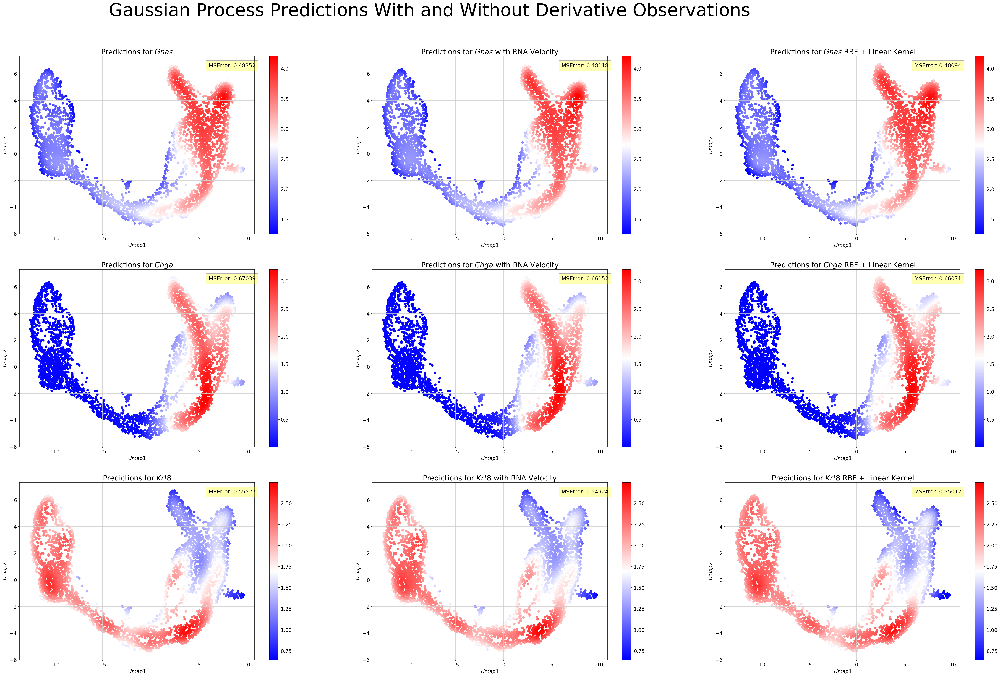

In [35]:
%matplotlib inline
fig, axs = plt.subplots(3, 3, figsize=(50,30))
dy_x1 = adata.obsm["velocity_umap"][:, 0]
dy_x2 = adata.obsm["velocity_umap"][:, 1]
X = adata.obsm["X_umap"][:, :2]
for i, gene in enumerate(last[:3]):

    y = adata.X[:, genes[gene]].A.reshape(-1)
    gp.fit(X, y.reshape(-1, 1), sample_ratio=0.7)
    pred = gp.predict(X)
    gp_error = loss(y, pred.reshape(-1))
    
    Y = np.hstack((y.reshape(-1), dy_x1, dy_x2))
    gp_do.fit(X, Y.reshape(-1, 1), sample_ratio=0.7)
    pred_do = gp_do.predict(X)
    gp_do_error = loss(y, pred_do.reshape(-1))

    gp_combined.fit(X, y.reshape(-1, 1), sample_ratio=0.7)
    pred_combined = gp_combined.predict(X)
    gp_combined_error = loss(y, pred_combined.reshape(-1))
    
    _min, _max = min(pred_do), max(pred_do)

    p = axs[i][0].scatter(X[:, 0], X[:, 1],  c=pred.reshape(-1), vmin=_min, vmax=_max, cmap='bwr')
    axs[i][0].text(6, 6.5, 'MSError: {:.5f}'.format(gp_error),
        bbox={'facecolor': 'yellow', 'alpha': 0.3, 'pad': 7}, fontsize=15)
    axs[i][0].set_xlabel('$Umap1$')
    axs[i][0].set_ylabel('$Umap2$')
    axs[i][0].set_title("Predictions for ${gene}$".format(gene=gene), fontsize=20)
    fig.colorbar(p, ax=axs[i][0])

    p = axs[i][1].scatter(X[:, 0], X[:, 1],  c=pred_do.reshape(-1), vmin=_min, vmax=_max, cmap='bwr')
    axs[i][1].text(6, 6.5, 'MSError: {:.5f}'.format(gp_do_error),
        bbox={'facecolor': 'yellow', 'alpha': 0.3, 'pad': 7}, fontsize=15)
    axs[i][1].set_xlabel('$Umap1$')
    axs[i][1].set_ylabel('$Umap2$')
    axs[i][1].set_title("Predictions for ${gene}$ with RNA Velocity".format(gene=gene), fontsize=20)
    fig.colorbar(p, ax=axs[i][1])
    

    p = axs[i][2].scatter(X[:, 0], X[:, 1],  c=pred_combined.reshape(-1), vmin=_min, vmax=_max, cmap='bwr')
    axs[i][2].text(6, 6.5, 'MSError: {:.5f}'.format(gp_combined_error),
        bbox={'facecolor': 'yellow', 'alpha': 0.3, 'pad': 7}, fontsize=15)
    axs[i][2].set_xlabel('$Umap1$')
    axs[i][2].set_ylabel('$Umap2$')
    axs[i][2].set_title("Predictions for ${gene}$ RBF + Linear Kernel".format(gene=gene), fontsize=20)
    fig.colorbar(p, ax=axs[i][2])
    
#     scv.pl.velocity_embedding_grid(adata, density = 0.4, basis='X_umap', color=gene, color_map="bwr",
#                                    size=300, alpha=0.3, arrow_length=3, arrow_size=2.3, colorbar=True,
#                                    show=False, ax=axs[i][3],
#                                    title="Actual values for ${gene}$ with RNA Velocity".format(gene=gene),
#                                    fontsize=20)
#     p = axs[i][2].scatter(X[:, 0], X[:, 1],  c=np.absolute(matrix.X[:, gene_id[gene]] - pred.reshape(-1)), cmap='Greys', alpha=0.5)

#     fig.colorbar(p, ax=axs[i][2])
    
fig.suptitle("Gaussian Process Predictions With and Without Derivative Observations",  fontsize=50)   
fig.savefig("pancreatic_endocrinogenesis_top_3_least_smooth_genes_3_models.png", transparent=False)

# Analyse Genes Rankings For Each Model

In [36]:
genes = {key:idx for idx, key in enumerate(list(zip(*sorted(list(lh.items()), key=lambda x:x[1], reverse=True)))[0])}
genes_do = {key:idx for idx, key in enumerate(list(zip(*sorted(list(lh_do.items()), key=lambda x:x[1], reverse=True)))[0])}
genes_combined = {key:idx for idx, key in enumerate(list(zip(*sorted(list(lh_combined.items()), key=lambda x:x[1], reverse=True)))[0])}

In [37]:
pos = {}
for key in lh.keys():
    pos[key] = genes_do[key] - genes[key]
    
print("GP vs GP + RNA Velocity".center(100))
print()
print("*********************************************************************************************".center(100))
print()
print("------------------------------------  UP  ------------------------------------\n\n", [gene for gene, p in pos.items() if p > 0])
print()
print("------------------------------------  DOWN  ------------------------------------\n\n", [gene for gene, p in pos.items() if p < 0])
print()
print("------------------------------------ UNCGANGED  ------------------------------------\n\n", [gene for gene, p in pos.items() if p == 0])

                                      GP vs GP + RNA Velocity                                       

   *********************************************************************************************    

------------------------------------  UP  ------------------------------------

 []

------------------------------------  DOWN  ------------------------------------

 []

------------------------------------ UNCGANGED  ------------------------------------

 ['Sbspon', 'Tbc1d8', 'Fhl2', 'Slc40a1', '1700019D03Rik', 'Pgap1', 'Ankrd44', 'Klf7', 'Akr1cl', 'Fn1', 'Mreg', 'March4', 'Igfbp5', 'Ptprn', 'Epha4', 'Serpine2', 'Sphkap', 'Dner', 'Kif1a', 'Dtymk', 'Pam', 'Bcl2', 'Tmem163', 'Mcm6', 'Nfasc', 'Nav1', 'Trove2', 'Rgs2', 'Swt1', 'Npl', 'Qsox1', 'Soat1', 'Pappa2', 'Fmo1', 'Fmo2', 'Mpzl1', 'Cep170', 'Tgfb2', 'Cenpf', 'Prox1', 'Vash2', 'Atf3', 'Dtl', 'St18', 'Gdap1', 'Col9a1', 'Dst', 'Il1r1', 'Zdbf2', 'Unc80', 'Igfbp2', 'Vil1', 'Dnajb2', 'Nuak2', 'Lrrn2', 'Plekha6', 'Kdm5b', 'Csrp1', 'Rgs16'

In [38]:
pos = {}
for key in lh.keys():
    pos[key] = genes_combined[key] - genes[key] 
    
print("GP vs GP + Combined Kernel".center(100))
print()
print("*********************************************************************************************".center(100))
print()
print("------------------------------------  UP  ------------------------------------\n\n", [gene for gene, p in pos.items() if p > 200])
print()
print("------------------------------------  DOWN  ------------------------------------\n\n", [gene for gene, p in pos.items() if p < -200])
print()
print("------------------------------------ UNCGANGED  ------------------------------------\n\n", [gene for gene, p in pos.items() if p == 0])

                                     GP vs GP + Combined Kernel                                     

   *********************************************************************************************    

------------------------------------  UP  ------------------------------------

 []

------------------------------------  DOWN  ------------------------------------

 []

------------------------------------ UNCGANGED  ------------------------------------

 ['Shc2', '1500009L16Rik', 'H2afv', 'Mpp2', 'Mxra7', 'Ebf1', 'Wnt9a', 'Scin', 'Akr1c12', 'Emb', 'Fam105a', 'Fbxo32', 'Desi1', 'Calcoco1', 'Plcxd3', 'March11', 'Mcm4', 'Etv5', 'St3gal6', 'Rsph9', 'Cdh2', 'Tmem109', 'Hacd1', 'Spc25', 'Npdc1', 'G630016G05Rik', 'Rpn2', 'Nnat', 'Gnas', 'Ptbp3', 'Ambp', 'Slc5a9', 'Efhd2', 'Kcnk3', 'Ica1', 'Itpr1', 'Ppp1r37', 'Bckdha', 'Actn4', 'Ttyh1', 'Tssc4', 'Galns', '6430573F11Rik', 'Tubb3', '4931429I11Rik', 'Tpm1', 'Snap91', 'Hspa8', 'Fgf13', 'Wnk3']


In [39]:
pos = {}
for key in lh.keys():
    pos[key] = genes_do[key] - genes_combined[key]
    
print("GP + RNA Velocity vs GP + Combined Kernel".center(100))
print()
print("*********************************************************************************************".center(100))
print()
print("------------------------------------  UP  ------------------------------------\n\n", [gene for gene, p in pos.items() if p > 200])
print()
print("------------------------------------  DOWN  ------------------------------------\n\n", [gene for gene, p in pos.items() if p < -200])
print()
print("------------------------------------ UNCGANGED  ------------------------------------\n\n", [gene for gene, p in pos.items() if p == 0])

                             GP + RNA Velocity vs GP + Combined Kernel                              

   *********************************************************************************************    

------------------------------------  UP  ------------------------------------

 []

------------------------------------  DOWN  ------------------------------------

 []

------------------------------------ UNCGANGED  ------------------------------------

 ['Shc2', '1500009L16Rik', 'H2afv', 'Mpp2', 'Mxra7', 'Ebf1', 'Wnt9a', 'Scin', 'Akr1c12', 'Emb', 'Fam105a', 'Fbxo32', 'Desi1', 'Calcoco1', 'Plcxd3', 'March11', 'Mcm4', 'Etv5', 'St3gal6', 'Rsph9', 'Cdh2', 'Tmem109', 'Hacd1', 'Spc25', 'Npdc1', 'G630016G05Rik', 'Rpn2', 'Nnat', 'Gnas', 'Ptbp3', 'Ambp', 'Slc5a9', 'Efhd2', 'Kcnk3', 'Ica1', 'Itpr1', 'Ppp1r37', 'Bckdha', 'Actn4', 'Ttyh1', 'Tssc4', 'Galns', '6430573F11Rik', 'Tubb3', '4931429I11Rik', 'Tpm1', 'Snap91', 'Hspa8', 'Fgf13', 'Wnk3']


### Results from Mean Squared Error 

    1. GP vs GP + RNA Velocity: The value of t is -13.20413. The value of p is < .00001. 
    The result is significant at p < .05.

    2. GP vs GP + Combined Kernel: The value of t is 13.87756. The value of p is < .00001. 
    The result isignificant at p < .05.
        
    3. GP + RNA Velocity vs GP + Combined Kernel: The value of t is 19.027366. The value of p is < .00001. 
    The result is significant at p < .05.

# Compare Identified Genes by Models to Highly Variable Genes

In [ ]:
sc.pp.highly_variable_genes(adata)

In [ ]:
higly_variable = [gene for gene in adata.var["highly_variable"].index if adata.var["highly_variable"][gene]]
all_genes = {gene:i for i, gene in enumerate(list(adata.var["velocity_genes"].index))}

In [ ]:
kernel_hv = RBFKernel(alpha=1, gamma=1)
gp_hv = GP(kernel=kernel, derivative_observations=True, alpha=1e-7, optimize=True, restarts=0)

In [ ]:
error_hv = []
error_weighted_hv = []

X = adata.obsm["X_umap"][:, :2]
dy_x1 = adata.obsm["velocity_umap"][:, 0]
dy_x2 = adata.obsm["velocity_umap"][:, 1]

In [ ]:
#### Optimize for random gene
random_gene = np.random.choice(higly_variable)
print(random_gene)
y = adata.X.A[:, all_genes[random_gene]].reshape(-1)
Y = np.hstack((y, dy_x1, dy_x2))
gp_hv.fit(X, Y.reshape(-1, 1), sample_ratio=0.5)
kernel_hv.gamma

In [ ]:
for gene in higly_variable:
    y = adata.X[:, all_genes[gene]].A.reshape(-1)
    Y = np.hstack((y, dy_x1, dy_x2))
    gp_hv.fit(X, Y.reshape(-1, 1), sample_ratio=0.5)
    gp_hv.log_marginal_likelihood(gene, info=True)
    pred = gp_hv.predict(X)
    error_hv.append(np.sqrt(np.sum((y - pred)**2)/X.shape[0]))
    error_weighted_hv.append(loss(y, pred))

In [ ]:
lh_hv = gp_hv.get_all_likelihoods()
top_hv = list(zip(*sorted(list(lh_hv.items()), key=lambda x:x[1], reverse=True)))[0]
last_hv = top_hv[::-1]
top_hv[:10]

In [78]:
last_hv[:10]

('Xist',
 'Chgb',
 'Ghrl',
 'Ins1',
 'Cck',
 'Nnat',
 'Ins2',
 'Cdkn1a',
 'Chga',
 'Lrpprc')

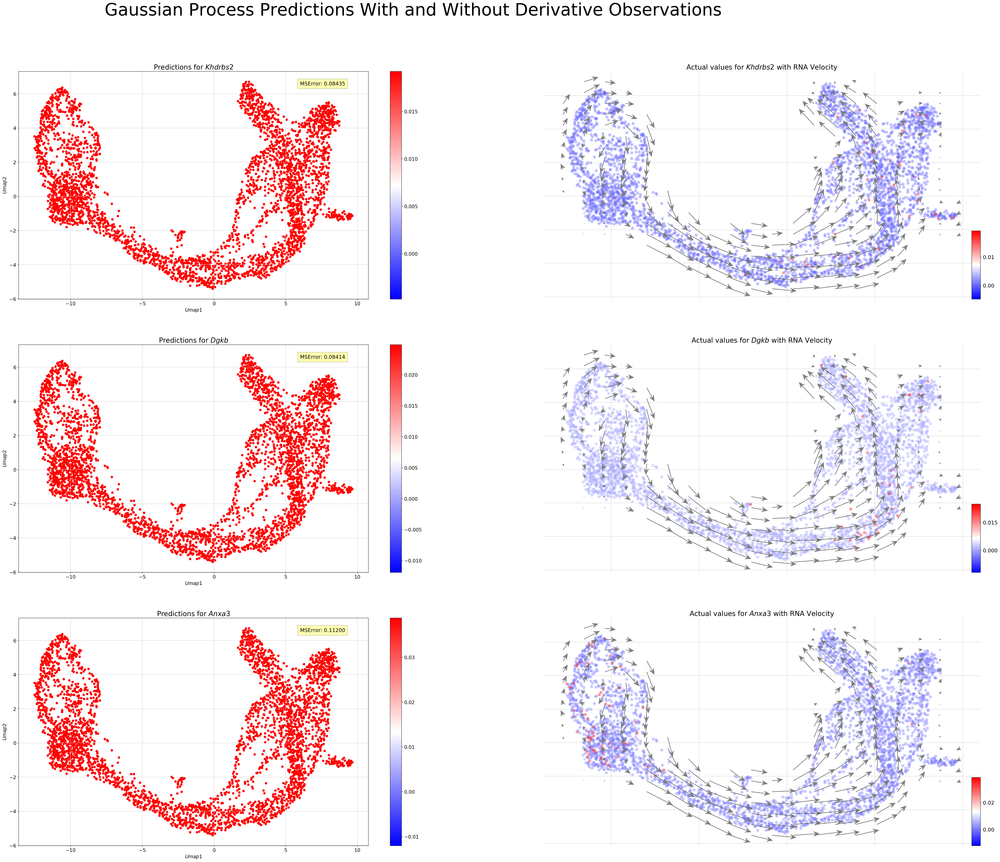

In [82]:
%matplotlib inline
fig, axs = plt.subplots(3,2, figsize=(50,40))
X = adata.obsm["X_umap"][:, :2]

for i, gene in enumerate(top_hv[:3]):

    y = adata.X[:, genes[gene]].A.reshape(-1)
    Y = np.hstack((y, dy_x1, dy_x2))
    gp_hv.fit(X, Y.reshape(-1, 1), sample_ratio=0.7)
    pred_hv = gp_hv.predict(X)
    gp_hv_error = loss(y, pred_hv.reshape(-1))
    
    p = axs[i][0].scatter(X[:, 0], X[:, 1],  c=pred.reshape(-1), cmap='bwr', vmin=np.min(pred_hv), vmax=np.max(pred_hv))
    axs[i][0].text(6, 6.5, 'MSError: {:.5f}'.format(gp_hv_error),
        bbox={'facecolor': 'yellow', 'alpha': 0.3, 'pad': 7}, fontsize=15)
    axs[i][0].set_xlabel('$Umap1$')
    axs[i][0].set_ylabel('$Umap2$')
    axs[i][0].set_title("Predictions for ${gene}$".format(gene=gene), fontsize=20)
    fig.colorbar(p, ax=axs[i][0])

    scv.pl.velocity_embedding_grid(adata, density = 0.4, basis='X_umap', color=gene, color_map="bwr",
                                   size=300, alpha=0.4, arrow_length=3, arrow_size=2.3, colorbar=True,
                                   show=False, ax=axs[i][1], vmin=np.min(pred_hv), vmax=np.max(pred_hv),
                                   title="Actual values for ${gene}$ with RNA Velocity".format(gene=gene),
                                   fontsize=20)
    
fig.suptitle("Gaussian Process Predictions With and Without Derivative Observations",  fontsize=50)   
fig.savefig("pancreatic_endocrinogenesis_top_3_smoothest_highly_variable_genes.png", transparent=False)